In [9]:
# !pip3 install pickle matplotlib pandas numpy pyabf
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyabf


In [10]:

# Load it back from the file
with open("binned_waveforms.pkl", "rb") as f:
    binned_waveforms = pickle.load(f)

print("Loaded:", list(binned_waveforms.keys())[:5])  # peek at a few keys


Loaded: [(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary'), (np.float64(32.61578604044627), 'Excitatory', 'CaP', 'primary'), (np.float64(36.50967506389131), 'Excitatory', 'CaP', 'primary'), (np.float64(26.212319790300285), 'Excitatory', 'CaP', 'primary'), (np.float64(22.836263987212853), 'Excitatory', 'CaP', 'primary')]


In [32]:
key_counts_all

Counter({('15–25', 'Cell-attached', 'MiP', 'primary'): 986,
         ('25–35', 'Excitatory', 'vRoP', 'primary'): 881,
         ('25–35', 'Cell-attached', 'MiP', 'primary'): 878,
         ('15–25', 'Cell-attached', 'CaP', 'primary'): 794,
         ('25–35', 'Cell-attached', 'vRoP', 'primary'): 599,
         ('25–35', 'Inhibitory', 'dSMN', 'Low Rin Secondary '): 593,
         ('25–35', 'Inhibitory', 'vSMN', 'Low Rin Secondary '): 426,
         ('25–35', 'Inhibitory', 'vRoP', 'primary'): 417,
         ('25–35', 'Excitatory', 'MiP', 'primary'): 376,
         ('15–25', 'Cell-attached', 'iSMN', 'High Rin Secondary'): 352,
         ('25–35', 'Cell-attached', 'dSMN', 'Low Rin Secondary '): 330,
         ('25–35', 'Excitatory', 'vSMN', 'Low Rin Secondary '): 296,
         ('25–35', 'Inhibitory', 'MiP', 'primary'): 279,
         ('25–35', 'Excitatory', 'dSMN', 'Low Rin Secondary '): 269,
         ('25–35', 'Cell-attached', 'dRoP', 'primary'): 267,
         ('25–35', 'Cell-attached', 'vSMN ', 'Hi

In [34]:
len(binned_waveforms.keys())

14890

In [71]:
binned_waveforms.keys()

dict_keys([(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary'), (np.float64(32.61578604044627), 'Excitatory', 'CaP', 'primary'), (np.float64(36.50967506389131), 'Excitatory', 'CaP', 'primary'), (np.float64(26.212319790300285), 'Excitatory', 'CaP', 'primary'), (np.float64(22.836263987212853), 'Excitatory', 'CaP', 'primary'), (np.float64(27.21829069134327), 'Excitatory', 'CaP', 'primary'), (np.float64(28.137310073156204), 'Excitatory', 'CaP', 'primary'), (np.float64(1.0798319781442016), 'Excitatory', 'CaP', 'primary'), (np.float64(40.78303425775046), 'Excitatory', 'CaP', 'primary'), (np.float64(40.35512510088814), 'Excitatory', 'CaP', 'primary'), (np.float64(41.562759767250895), 'Excitatory', 'CaP', 'primary'), (np.float64(45.955882352940236), 'Excitatory', 'CaP', 'primary'), (np.float64(138.1215469612683), 'Excitatory', 'CaP', 'primary'), (np.float64(54.495912806545185), 'Excitatory', 'CaP', 'primary'), (np.float64(38.88024883359292), 'Excitatory', 'CaP', 'primary'), (np.fl

In [47]:
binned_waveforms[(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary')]

,Phase Bin,Current,Normalized Current,Phase
0,"(-0.001, 0.02]",-607.958923,0.382365,0.01
1,"(0.02, 0.04]",-601.768738,0.390906,0.03
2,"(0.04, 0.06]",-657.632141,0.313825,0.05
3,"(0.06, 0.08]",-623.532043,0.360877,0.07
4,"(0.08, 0.1]",-708.991272,0.242958,0.09
5,"(0.1, 0.12]",-675.252747,0.289511,0.11
6,"(0.12, 0.14]",-595.503784,0.399551,0.13
7,"(0.14, 0.16]",-733.101624,0.209690,0.15
8,"(0.16, 0.18]",-706.474121,0.246431,0.17
9,"(0.18, 0.2]",-769.347290,0.159678,0.19


In [50]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif freq >= 45:
        return "45+"
    else:
        return "<15"

def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    return cell_type
key_counts_all = Counter()

for freq, signal_type,cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    grouped_key = (freq_bin, signal_type, cell_type_gen, fast_slow)
    key_counts_all[grouped_key] += 1

print(f"Unique waveform types: {len(key_counts_all)}\n")

def average_waveforms_for_key(counter_key):
    '''
    Function that takes a counter key like ('15–25', 'Cell-attached', 'MiP', 'primary')
    Returns a DataFrame with mean and SEM of normalized current for that key
    '''
    import numpy as np

    # Separate key code
    freq_bin, signal_type, cell_type, fast_slow = counter_key

    dfs = []  # To store matching waveform dataframes
    # loop through all binned waveforms
    for key in binned_waveforms.keys():
        freq, st, ct, fs = key
        # use get_freq_bin(freq) to turn float into bin, use group_iSMN() to generalize all iSMN
        if get_freq_bin(freq) == freq_bin and ct == group_iSMN(cell_type) and st == signal_type and fs == fast_slow:
            dfs.append(binned_waveforms[key].copy())

    # if no waveforms for key
    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None

    combined = pd.concat(dfs)

    # Compute mean and SEM per phase bin
    grouped = combined.groupby('Phase', observed=False)['Normalized Current']
    averaged = grouped.mean().reset_index(name='Normalized Current')
    sem = grouped.sem().reset_index(name='SEM')
    # Ensure SEM is float type
    sem['SEM'] = sem['SEM'].astype(float)
    # Merge mean and SEM into a single DataFrame
    result = pd.merge(averaged, sem, on='Phase')

    return result




Unique waveform types: 118



In [61]:
key_counts_all

Counter({('15–25', 'Cell-attached', 'MiP', 'primary'): 986,
         ('25–35', 'Excitatory', 'vRoP', 'primary'): 881,
         ('25–35', 'Cell-attached', 'MiP', 'primary'): 878,
         ('15–25', 'Cell-attached', 'CaP', 'primary'): 794,
         ('25–35', 'Cell-attached', 'vRoP', 'primary'): 599,
         ('25–35', 'Inhibitory', 'dSMN', 'Low Rin Secondary '): 593,
         ('25–35', 'Inhibitory', 'vSMN', 'Low Rin Secondary '): 426,
         ('25–35', 'Inhibitory', 'vRoP', 'primary'): 417,
         ('25–35', 'Excitatory', 'MiP', 'primary'): 376,
         ('15–25', 'Cell-attached', 'iSMN', 'High Rin Secondary'): 352,
         ('25–35', 'Cell-attached', 'dSMN', 'Low Rin Secondary '): 330,
         ('25–35', 'Excitatory', 'vSMN', 'Low Rin Secondary '): 296,
         ('25–35', 'Inhibitory', 'MiP', 'primary'): 279,
         ('25–35', 'Excitatory', 'dSMN', 'Low Rin Secondary '): 269,
         ('25–35', 'Cell-attached', 'dRoP', 'primary'): 267,
         ('25–35', 'Cell-attached', 'vSMN ', 'Hi

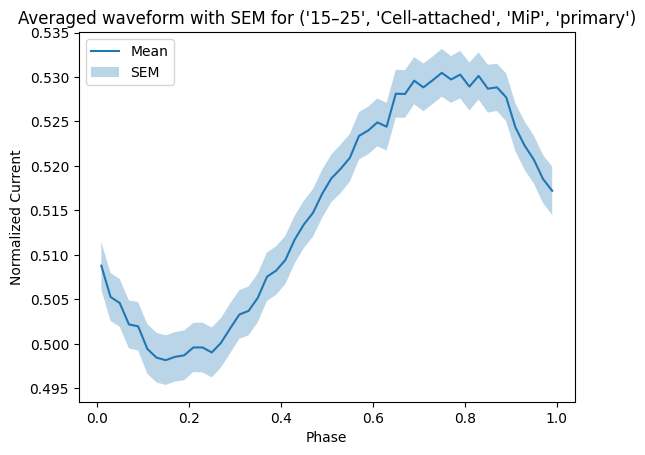

In [52]:

# Use a key from Counter
example_key = ('15–25', 'Cell-attached', 'MiP', 'primary')

avg_waveform_df = average_waveforms_for_key(example_key)
avg_waveform_df
if avg_waveform_df is not None:
    plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label='Mean')
    plt.fill_between(avg_waveform_df['Phase'],
                     avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                     avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                     alpha=0.3, label='SEM')
    plt.xlabel('Phase')
    plt.ylabel('Normalized Current')
    plt.title(f'Averaged waveform with SEM for {example_key}')
    plt.legend()
    plt.show()

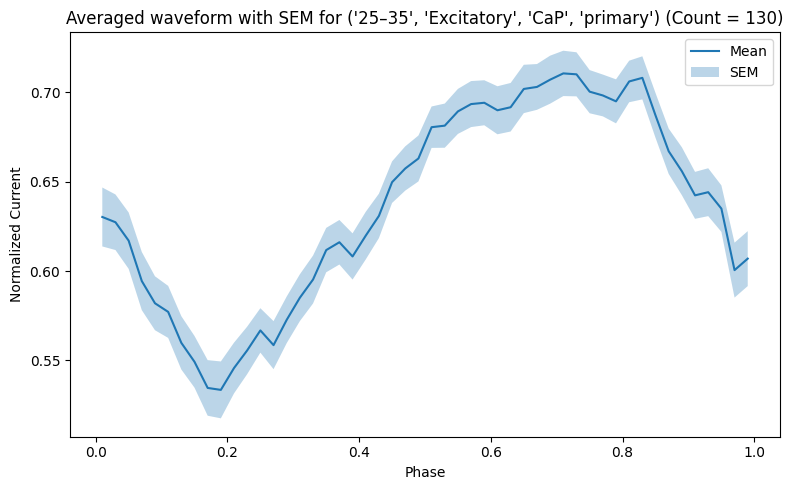

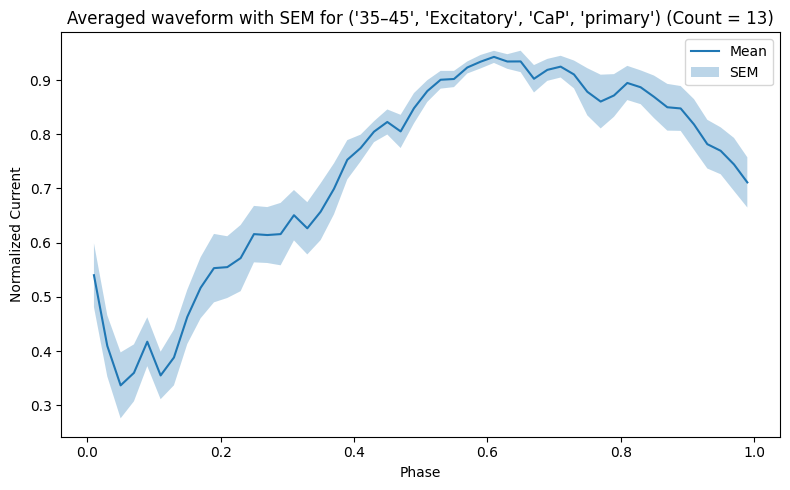

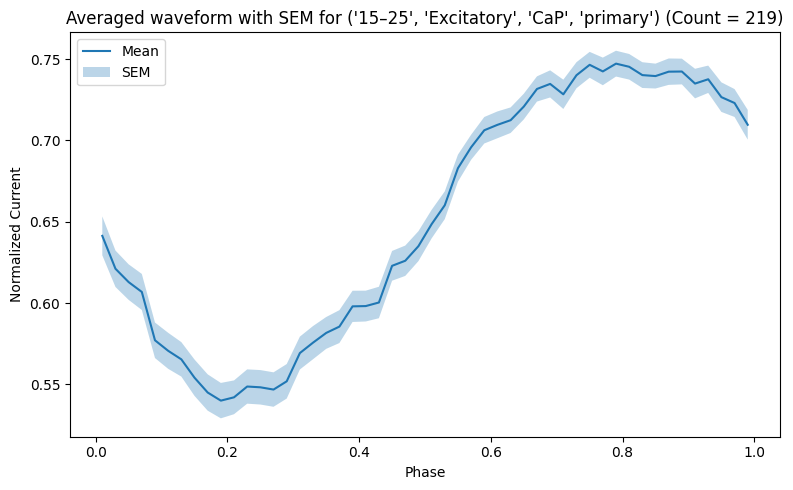

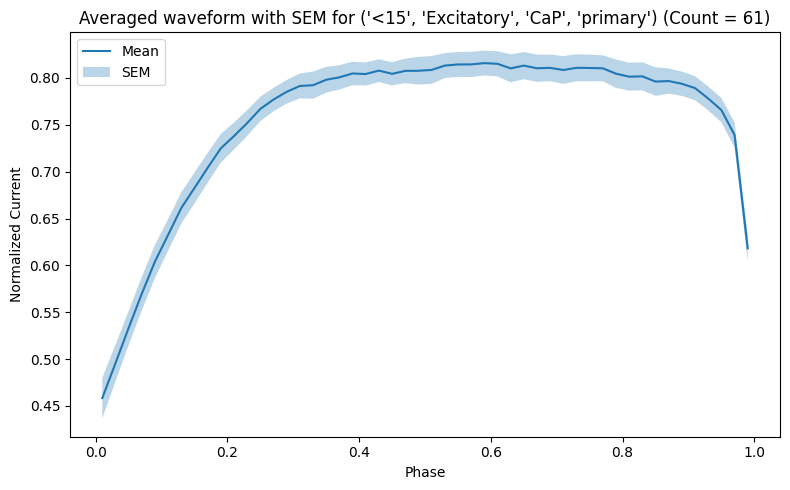

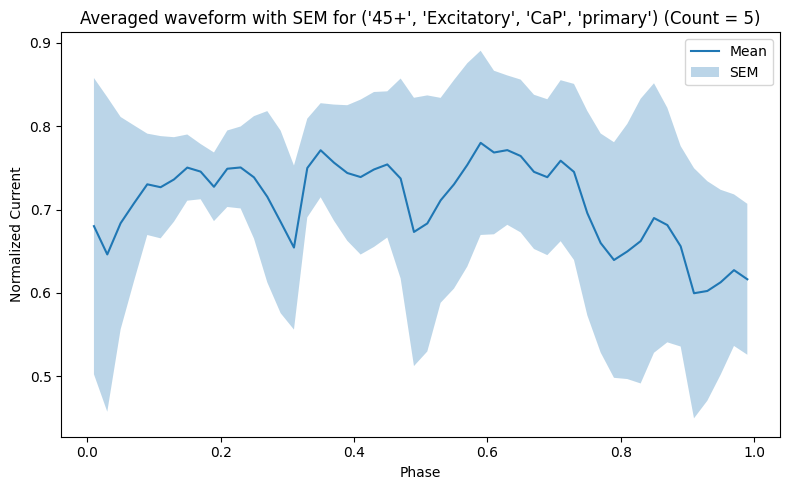

...

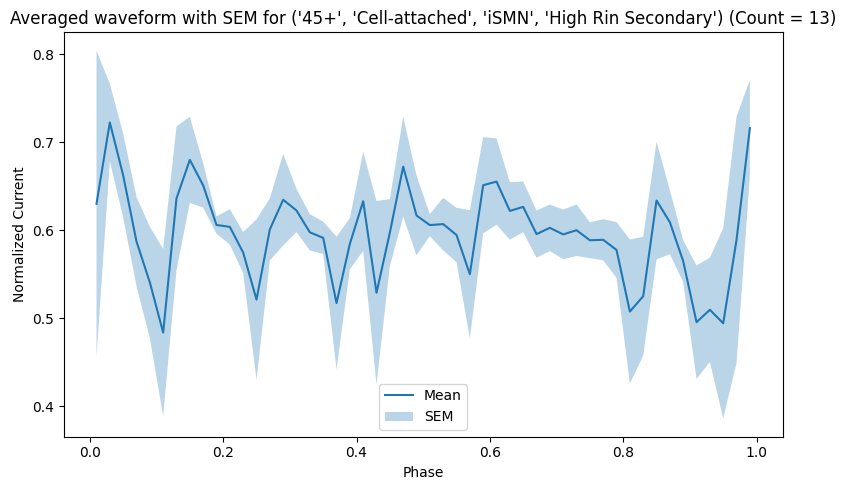

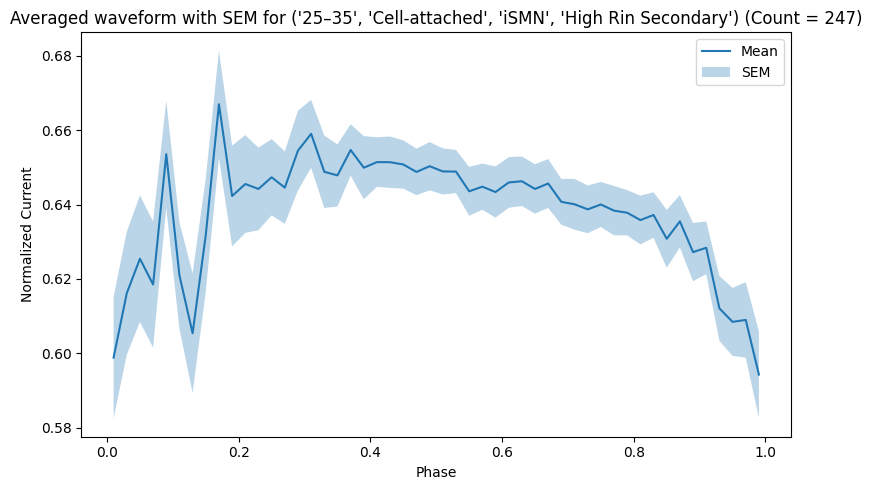

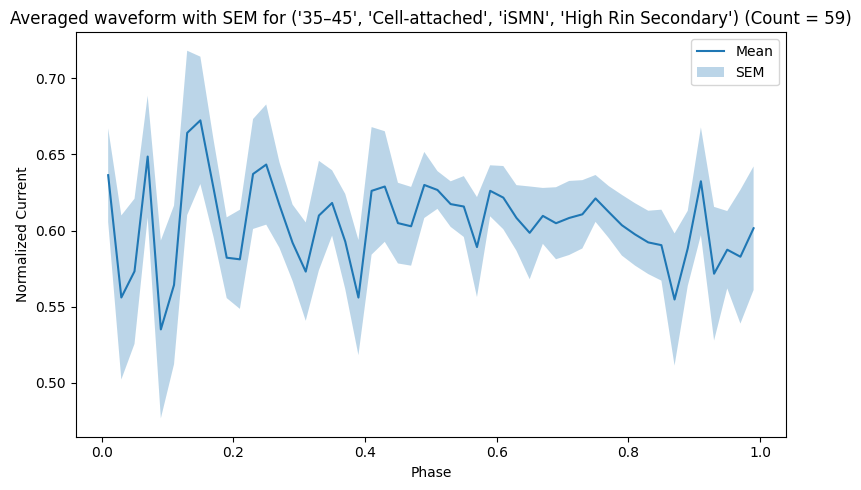

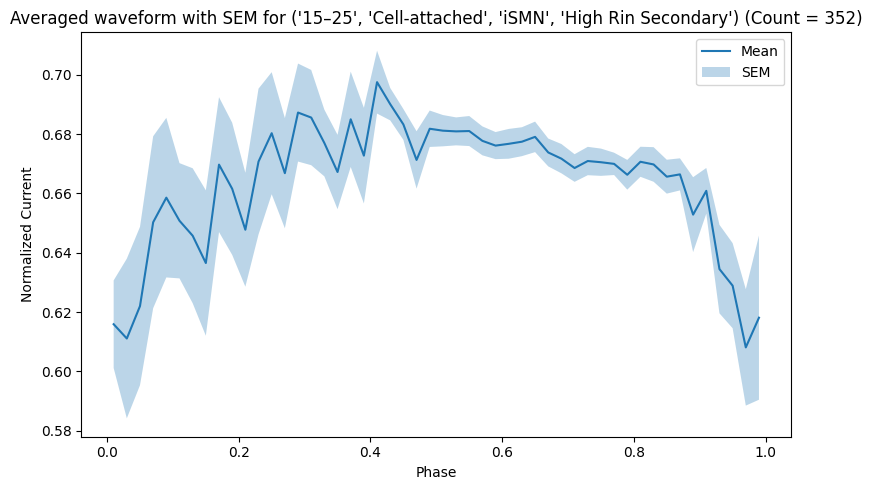

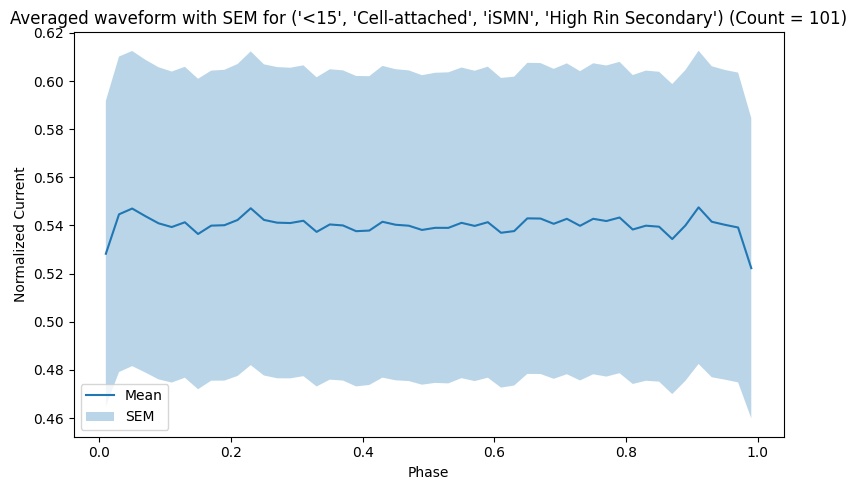

No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No data to plot for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No data to plot for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No data to plot for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No data to plot for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No data to plot for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No data to plot for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Excitat

In [62]:
for key in key_counts_all.keys():
    count = key_counts_all[key]  # Get count for current key
    avg_waveform_df = average_waveforms_for_key(key)
    
    if avg_waveform_df is not None and not avg_waveform_df.empty:
        plt.figure(figsize=(8, 5))
        plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label='Mean')
        plt.fill_between(
            avg_waveform_df['Phase'],
            avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
            avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
            alpha=0.3,
            label='SEM'
        )
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f'Averaged waveform with SEM for {key} (Count = {count})')  # Added count here
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print(f"No data to plot for {key}")


In [12]:
def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif freq >= 45:
        return "45+"


keyCounts_nocelltype = Counter()

for freq, signal_type,cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    grouped_key = (freq_bin, signal_type, fast_slow)
    keyCounts_nocelltype[grouped_key] += 1

print(f"Unique waveform types: {len(keyCounts_nocelltype)}\n")

Unique waveform types: 45



In [13]:
def average_waveforms_for_key(counter_key):
    '''
    Function that takes a counter key like ('15–25', 'Cell-attached', 'MiP', 'primary')
    Returns df of averaged waveform for that key
    '''
    #Separate key code
    freq_bin, signal_type,cell_type, fast_slow = counter_key
    
    dfs = [] # To store matching waveforms dataframes
    # loop through all binned waveforms
    for key in binned_waveforms.keys():
        freq, st,ct, fs = key
        # use get_freq_bin(freq) to turn float into bin, use group_iSMN() to generalize all iSMN
        if get_freq_bin(freq) == freq_bin and ct == group_iSMN(cell_type) and st == signal_type and fs == fast_slow:
            dfs.append(binned_waveforms[key].copy())
    # if no waveforms for key
    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None
    # combine all the data frames
    # print(len(dfs))
    combined = pd.concat(dfs)
    # print(combined.shape)
    averaged = combined.groupby('Phase Bin', observed=False).mean().reset_index()
    return averaged

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_42043/2317322608.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))  # or use 'Set1', 'tab20', etc.


Plotting waveforms for swimming speed: primary


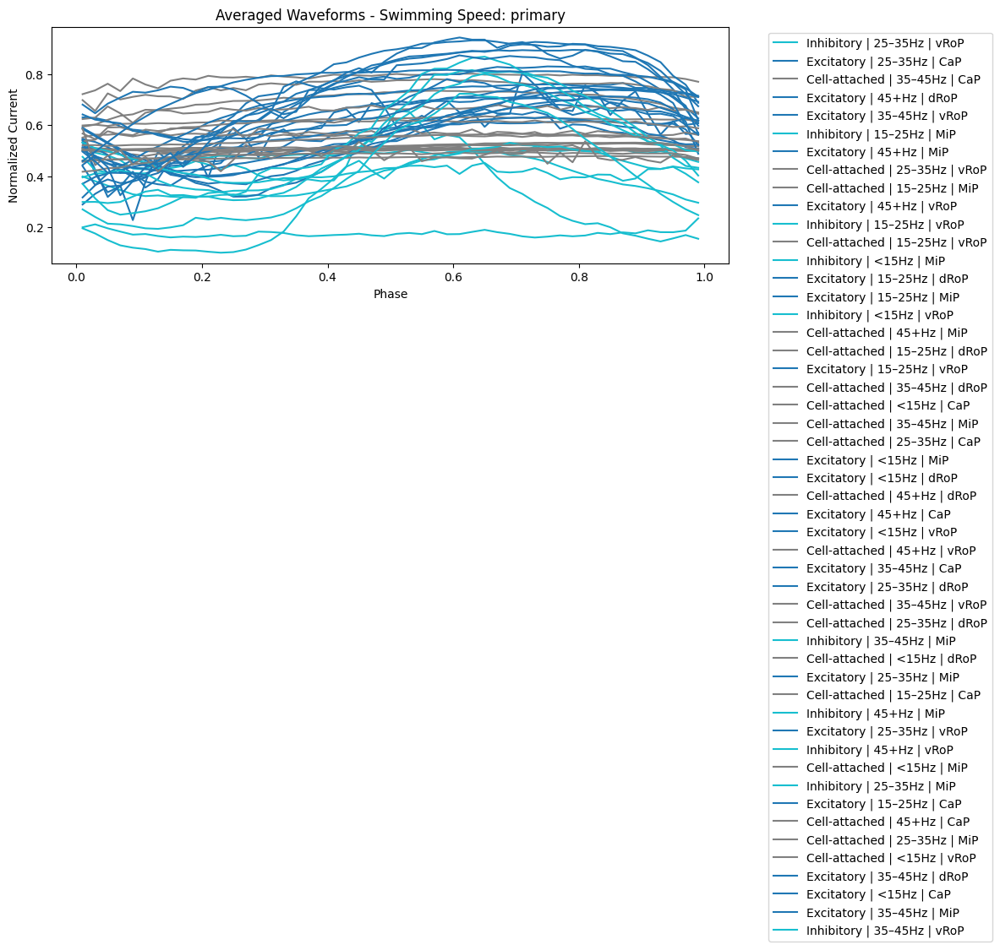

Plotting waveforms for swimming speed: Low Rin Secondary 


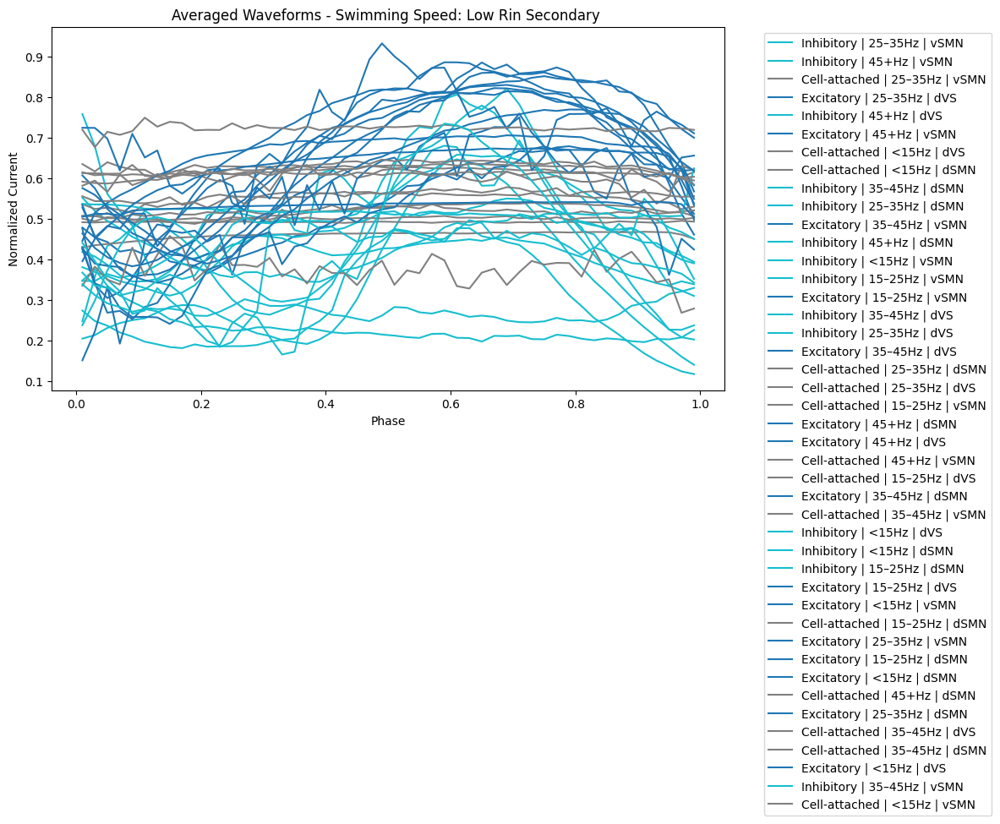

Plotting waveforms for swimming speed: High Rin Secondary
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('45+', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('35–45', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('15–25', 'Inhibitor

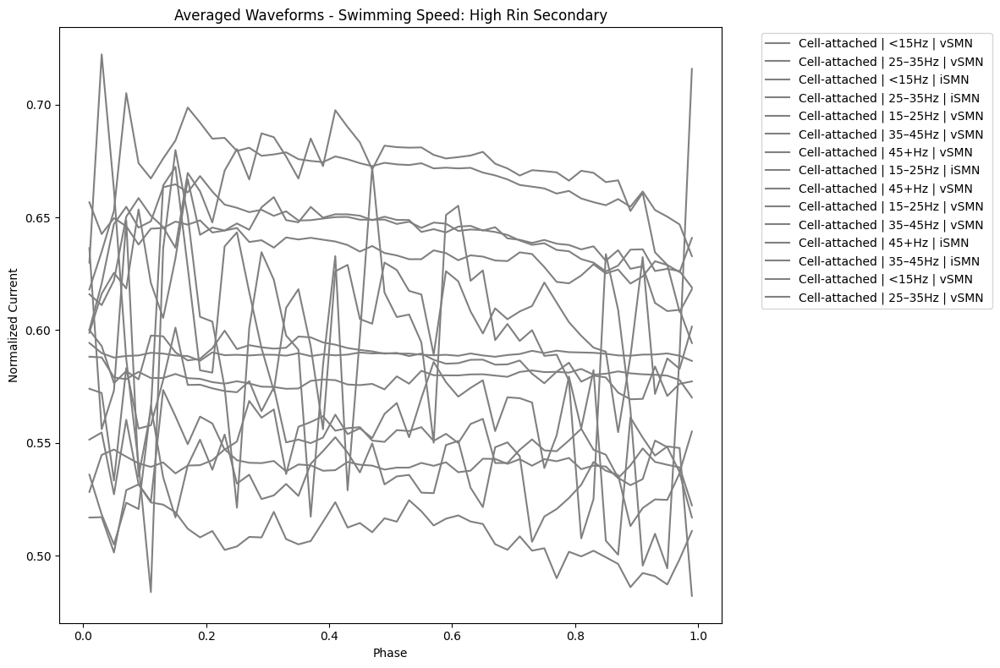

In [63]:
# Step 1: Group waveform keys by fast_slow (swimming speed)
waveforms_by_speed = defaultdict(list)
# signal_types = set()

for freq, signal_type, cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    grouped_key = (freq_bin, signal_type, cell_type_gen, fast_slow)
    waveforms_by_speed[fast_slow].append(grouped_key)
    # signal_types.add(signal_type)

signal_types = ["Inhibitory","Excitatory"]
# Step 2: Assign a unique color to each signal type
cmap = cm.get_cmap('tab10', len(signal_types))  # or use 'Set1', 'tab20', etc.
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Step 3: Plot one figure per swimming speed, with color coding by signal type
for speed_category, keys in waveforms_by_speed.items():
    plt.figure(figsize=(12, 8))
    print(f"Plotting waveforms for swimming speed: {speed_category}")

    plotted_any = False
    for key in set(keys):
        try:
            avg_waveform_df = average_waveforms_for_key(key)
            if avg_waveform_df is None or avg_waveform_df.empty:
                print(f"  Skipping: No data for {key}")
                continue

            signal_type = key[1]
            color = signal_type_colors.get(signal_type, 'gray')  # default to gray if missing
            label = f"{signal_type} | {key[0]}Hz | {key[2]}"
            plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                     label=label, color=color)
            plotted_any = True
        except Exception as e:
            print(f"  Error with {key}: {e}")
            continue

    if plotted_any:
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f'Averaged Waveforms - Swimming Speed: {speed_category}')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
    else:
        print(f"  No valid waveforms to plot for {speed_category}")


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_42043/4208336547.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


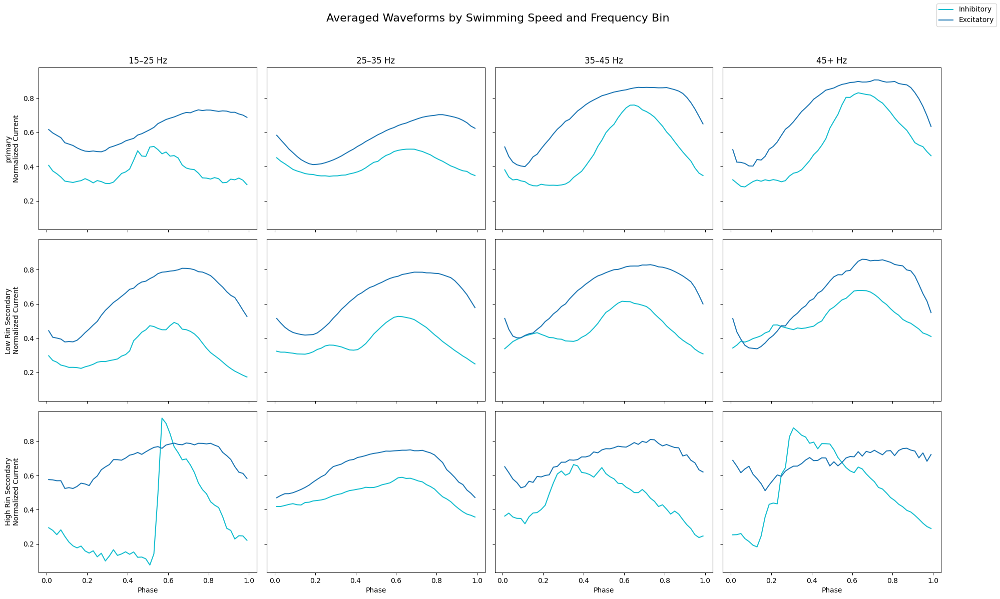

In [21]:

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Construct the key without cell type for this example
            matching_keys = [key for key in binned_waveforms.keys()
                             if get_freq_bin(key[0]) == freq_bin and
                                key[1] == signal_type and
                                key[3] == speed]
            
            dfs = [binned_waveforms[key].copy() for key in matching_keys]
            if not dfs:
                continue

            combined = pd.concat(dfs)
            averaged = combined.groupby('Phase Bin', observed=False).mean().reset_index()

            # Plot average waveform
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=signal_type, color=signal_type_colors[signal_type])

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend to the figure
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
fig.suptitle("Averaged Waveforms by Swimming Speed and Frequency Bin", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_42043/2357346873.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


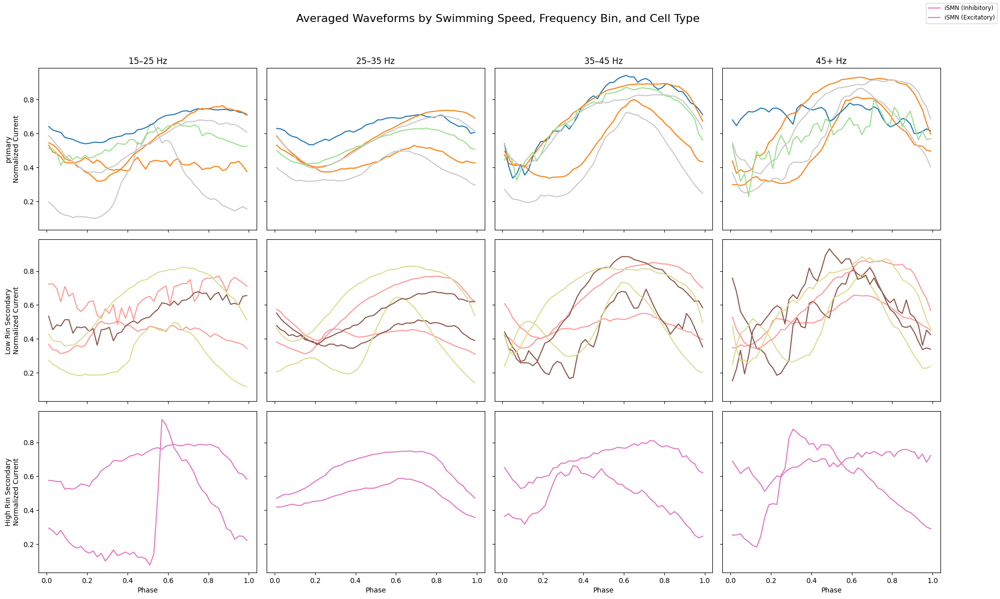

In [23]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import numpy as np
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Collect all unique cell types
cell_types = sorted(set(group_iSMN(key[2]) for key in binned_waveforms))

# Assign unique colors to each cell type
cmap = cm.get_cmap('tab20', len(cell_types))
cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            for cell_type in cell_types:
                matching_keys = [key for key in binned_waveforms.keys()
                                 if get_freq_bin(key[0]) == freq_bin and
                                    key[1] == signal_type and
                                    group_iSMN(key[2]) == cell_type and
                                    key[3] == speed]
                
                dfs = [binned_waveforms[key].copy() for key in matching_keys]
                if not dfs:
                    continue

                combined = pd.concat(dfs)
                averaged = combined.groupby('Phase Bin', observed=False).mean().reset_index()

                label = f"{cell_type} ({signal_type})"
                ax.plot(averaged['Phase'], averaged['Normalized Current'],
                        label=label, color=cell_type_colors[cell_type])

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize='small')
fig.suptitle("Averaged Waveforms by Swimming Speed, Frequency Bin, and Cell Type", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_42043/824992477.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dRoP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dVS', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'vSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'vSMN ', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'dSMN', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'dVS', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN ', 'primary')
No matching waveforms found for ('25–35', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found

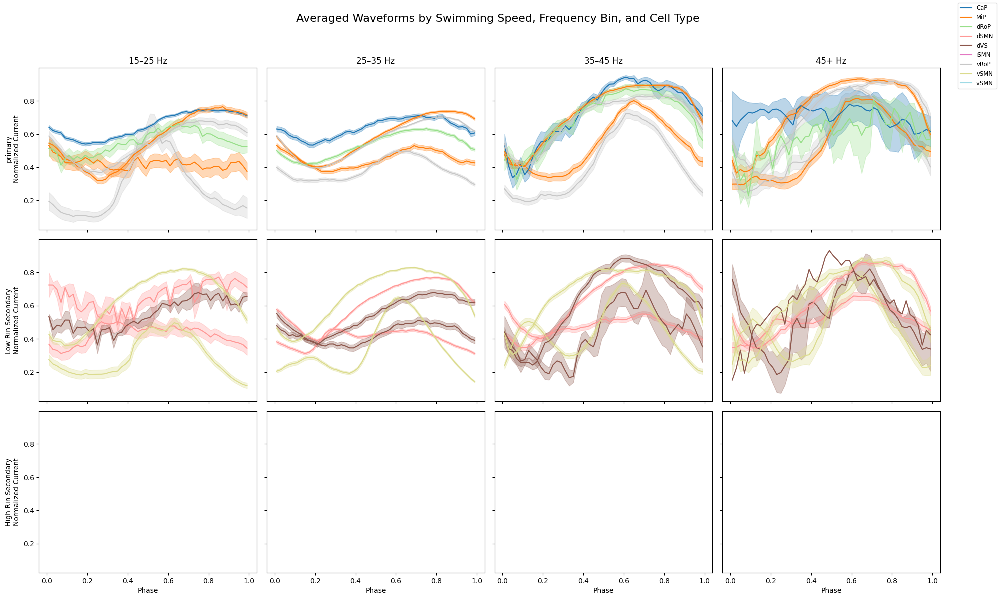

In [70]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Collect all unique cell types after grouping iSMN
cell_types = sorted(set(group_iSMN(key[2]) for key in binned_waveforms))

# Assign unique colors to each cell type
cmap = cm.get_cmap('tab20', len(cell_types))
cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            for cell_type in cell_types:
                counter_key = (freq_bin, signal_type, cell_type, speed)
                avg_waveform_df = average_waveforms_for_key(counter_key)
                if avg_waveform_df is None or avg_waveform_df.empty:
                    continue

                label = f"{cell_type} ({signal_type})"
                ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                        label=label, color=cell_type_colors[cell_type])
                ax.fill_between(avg_waveform_df['Phase'],
                                avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                                avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                                color=cell_type_colors[cell_type], alpha=0.3)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend
handles, labels = [], []
for ctype in cell_types:
    handles.append(plt.Line2D([0], [0], color=cell_type_colors[ctype]))
    labels.append(ctype)
fig.legend(handles, labels, loc='upper right', fontsize='small')

fig.suptitle("Averaged Waveforms by Swimming Speed, Frequency Bin, and Cell Type", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


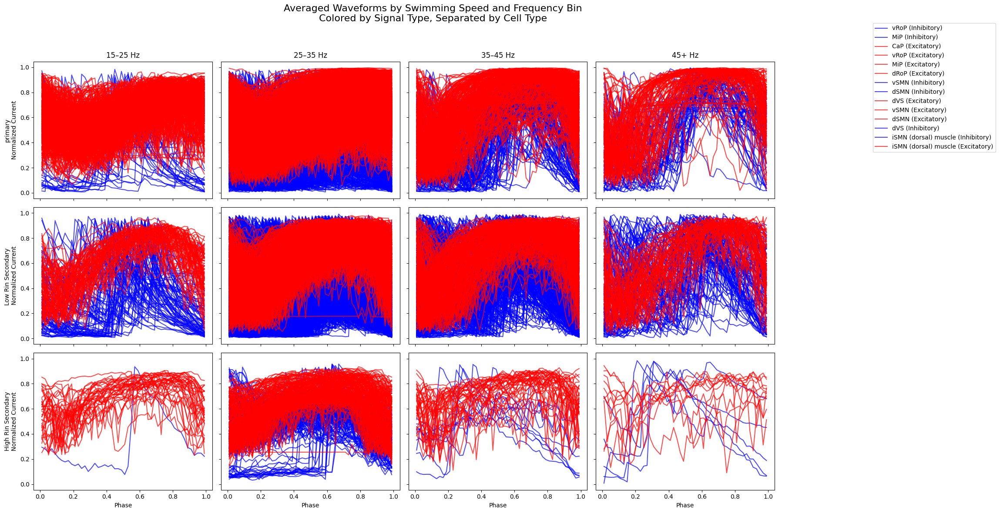

In [25]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import numpy as np
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types only
signal_type_colors = {"Inhibitory": "blue", "Excitatory": "red"}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Track which combinations have been plotted for global legend
global_handles_labels = {}

# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        plotted_any = False
        for signal_type in signal_types:
            # Get all matching keys for this freq, speed, and signal_type
            matching_keys = [key for key in binned_waveforms.keys()
                             if get_freq_bin(key[0]) == freq_bin and
                                key[1] == signal_type and
                                key[3] == speed]
            
            if not matching_keys:
                continue

            cell_types_seen = set()
            for key in matching_keys:
                cell_type = key[2]
                df = binned_waveforms[key].copy()
                if df.empty:
                    continue

                averaged = df.groupby('Phase Bin', observed=False).mean().reset_index()
                label = f"{cell_type} ({signal_type})"
                color = signal_type_colors[signal_type]

                line, = ax.plot(averaged['Phase'], averaged['Normalized Current'],
                        label=label, color=color, alpha=0.7)
                plotted_any = True

                # Track unique labels for legend
                global_handles_labels[label] = line

        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add global legend to the figure
fig.legend(global_handles_labels.values(), global_handles_labels.keys(), loc='upper right', bbox_to_anchor=(1.15, 0.95))
fig.suptitle("Averaged Waveforms by Swimming Speed and Frequency Bin\nColored by Signal Type, Separated by Cell Type", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


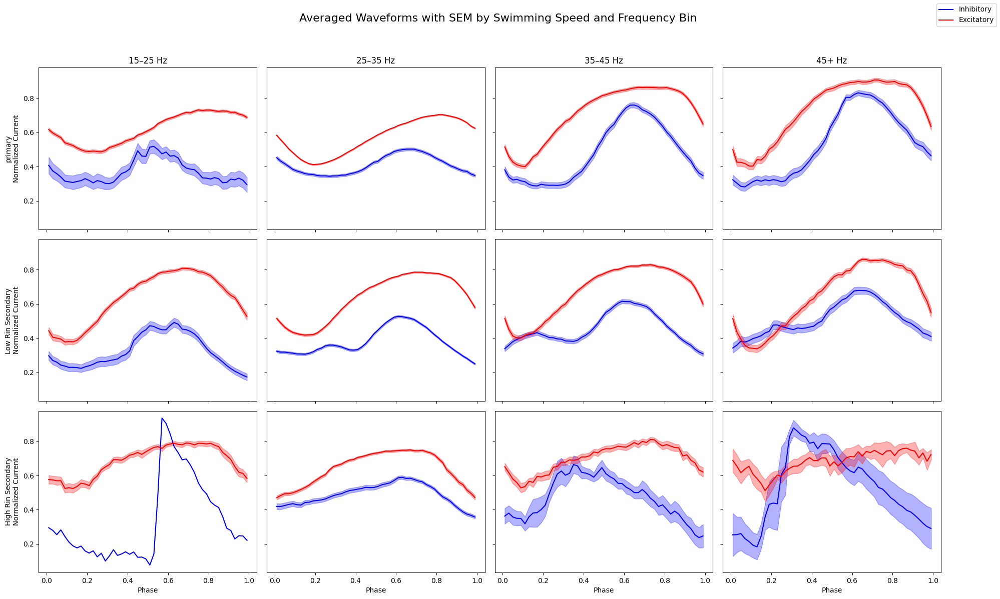

In [26]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import numpy as np
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
signal_type_colors = {
    "Inhibitory": "blue",
    "Excitatory": "red"
}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Group by cell type for averaging
            cell_type_dfs = defaultdict(list)
            for key in binned_waveforms.keys():
                if get_freq_bin(key[0]) == freq_bin and key[1] == signal_type and key[3] == speed:
                    cell_type = key[2]
                    cell_type_dfs[cell_type].append(binned_waveforms[key].copy())

            # Combine all dataframes per signal_type
            if not cell_type_dfs:
                continue

            all_data = []
            for dfs in cell_type_dfs.values():
                combined = pd.concat(dfs)
                all_data.append(combined)

            full_combined = pd.concat(all_data)
            grouped = full_combined.groupby('Phase Bin', observed=False)
            mean = grouped['Normalized Current'].mean()
            sem = grouped['Normalized Current'].sem()
            phase = grouped['Phase'].mean()

            # Plot mean with SEM boundaries
            ax.plot(phase, mean, label=signal_type, color=signal_type_colors[signal_type])
            ax.fill_between(phase, mean - sem, mean + sem, color=signal_type_colors[signal_type], alpha=0.3)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend to the figure
handles = [plt.Line2D([0], [0], color=color, label=stype) for stype, color in signal_type_colors.items()]
fig.legend(handles, [h.get_label() for h in handles], loc='upper right')
fig.suptitle("Averaged Waveforms with SEM by Swimming Speed and Frequency Bin", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_42043/1670276290.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


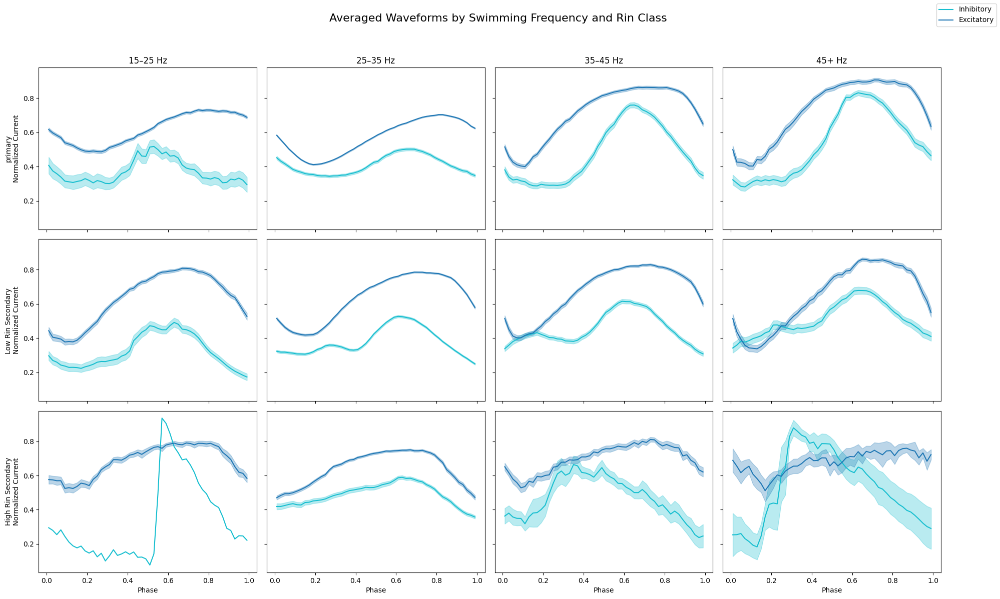

In [29]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import numpy as np
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Track which labels have been used to avoid duplicates in the legend
used_labels = set()
count = 0
# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Construct the key without cell type
            matching_keys = [key for key in binned_waveforms.keys()
                             if get_freq_bin(key[0]) == freq_bin and
                                key[1] == signal_type and
                                key[3] == speed]
            dfs = [binned_waveforms[key].copy() for key in matching_keys]
            if not dfs:
                continue
            count += 1
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend to the figure
handles, labels = [], []
for stype in signal_types:
    handles.append(plt.Line2D([0], [0], color=signal_type_colors[stype]))
    labels.append(stype)
fig.legend(handles, labels, loc='upper right')
fig.suptitle("Averaged Waveforms by Swimming Frequency and Rin Class", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_42043/3713597840.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dRoP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dVS', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN (dorsal) muscle', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'vSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'vSMN ', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'dSMN', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'dVS', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN (dorsal) muscle', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN', 'prima

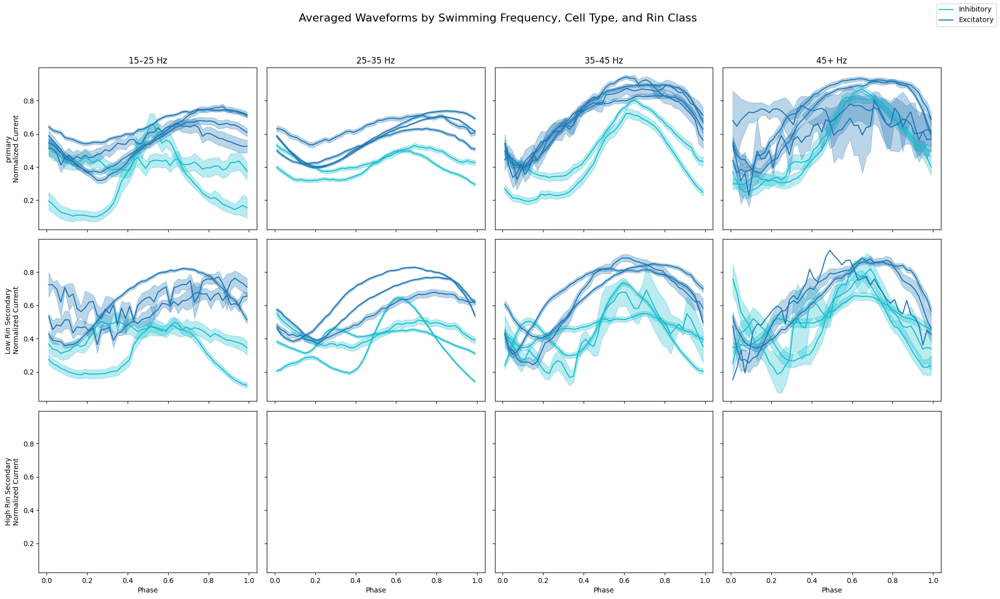

In [68]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Extract all unique cell types from your binned_waveforms keys
all_cell_types = sorted(set(key[2] for key in binned_waveforms.keys()))

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

used_labels = set()

for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            for cell_type in all_cell_types:
                counter_key = (freq_bin, signal_type, cell_type, speed)
                avg_waveform_df = average_waveforms_for_key(counter_key)

                if avg_waveform_df is None or avg_waveform_df.empty:
                    continue

                # Label only once per signal type to avoid duplicates in legend
                label = signal_type if signal_type not in used_labels else None

                ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                        label=label, color=signal_type_colors[signal_type])
                ax.fill_between(avg_waveform_df['Phase'],
                                avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                                avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                                color=signal_type_colors[signal_type], alpha=0.3)

                used_labels.add(signal_type)

        # Add titles and axis labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Create a common legend for the figure
handles = [plt.Line2D([0], [0], color=signal_type_colors[stype]) for stype in signal_types]
fig.legend(handles, signal_types, loc='upper right')

fig.suptitle("Averaged Waveforms by Swimming Frequency, Cell Type, and Rin Class", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()
